In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

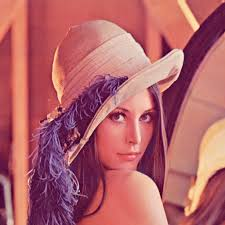

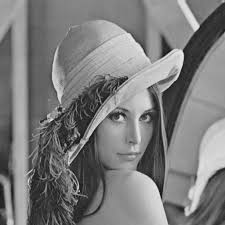

In [ ]:
img_path1 = "/content/lena_image.jpeg"
img1 = cv2.imread(img_path1)
cv2_imshow(img1)
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2GRAY)
cv2_imshow(img1)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def create_shift_mask(img):
    row, col = img.shape
    shift_mask = np.ones((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            if (i + j) % 2 == 1:
                shift_mask[i, j] = -1
    return shift_mask

def plot_filter_result(img, mask, fft, fft_filtered, img_back, title):
    cv2_imshow(img_back)
    mag = cv2.magnitude(fft[:,:,0], fft[:,:,1])
    fft_display = 20 * np.log(mag + 1)

    mag2 = cv2.magnitude(fft_filtered[:,:,0], fft_filtered[:,:,1])
    fft_filtered_display = 20 * np.log(mag2 + 1)

    plt.figure(figsize=(15, 10))

    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title(f'{title} Mask')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(fft_display, cmap='gray')
    plt.title('FFT Image')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(fft_filtered_display, cmap='gray')
    plt.title('FFT with Mask')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(img_back, cmap='gray')
    plt.title('Filtered Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


def apply_ideal_low_pass_plot(img, d0):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.zeros((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            if d <= d0:
                mask[i, j] = 1

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Ideal Low Pass")


def apply_ideal_high_pass_plot(img, d0):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.ones((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            if d <= d0:
                mask[i, j] = 0

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Ideal High Pass")


def apply_butterworth_low_pass_plot(img, d0, n):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.zeros((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            mask[i, j] = 1 / (1 + (d / d0)**(2 * n))

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Butterworth Low Pass")


def apply_butterworth_high_pass_plot(img, d0, n):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.zeros((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            if d == 0:
                mask[i, j] = 0
            else:
                mask[i, j] = 1 / (1 + (d0 / d)**(2 * n))

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Butterworth High Pass")


def apply_gaussian_low_pass_plot(img, d0):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.zeros((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            mask[i, j] = np.exp(-(d**2) / (2 * (d0**2)))

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Gaussian Low Pass")


def apply_gaussian_high_pass_plot(img, d0):
    row, col = img.shape
    c_row, c_col = row // 2, col // 2
    mask = np.zeros((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            mask[i, j] = 1 - np.exp(-(d**2) / (2 * (d0**2)))

    shift_mask = create_shift_mask(img)
    img_shifted = img * shift_mask

    fft = cv2.dft(np.float32(img_shifted), flags=cv2.DFT_COMPLEX_OUTPUT)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    fft_filtered = fft * mask_3d
    img_back = cv2.idft(fft_filtered, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plot_filter_result(img, mask, fft, fft_filtered, img_back, "Gaussian High Pass")


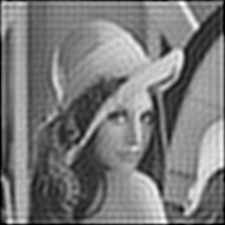

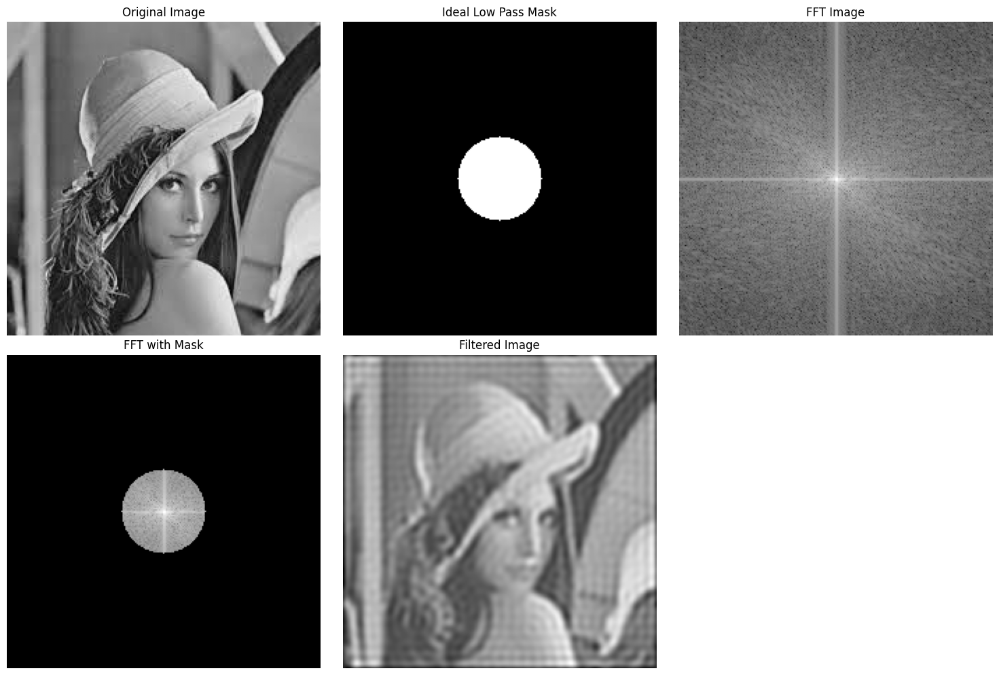

In [ ]:
apply_ideal_low_pass_plot(img1, 30)


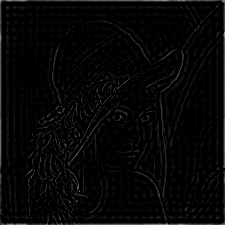

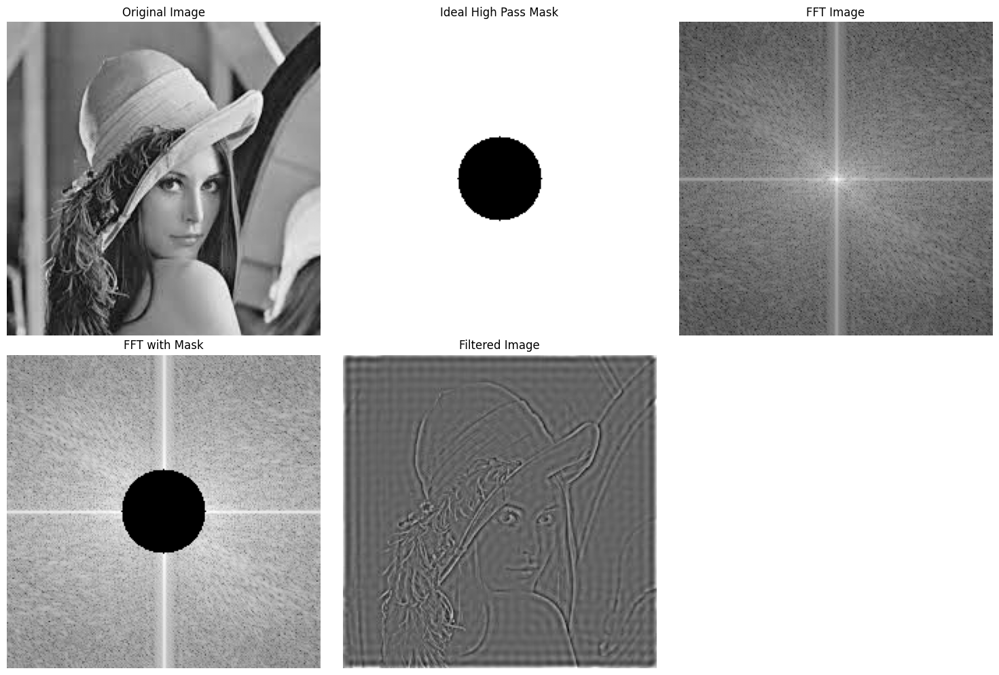

In [ ]:
apply_ideal_high_pass_plot(img1, 30)


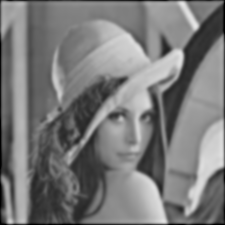

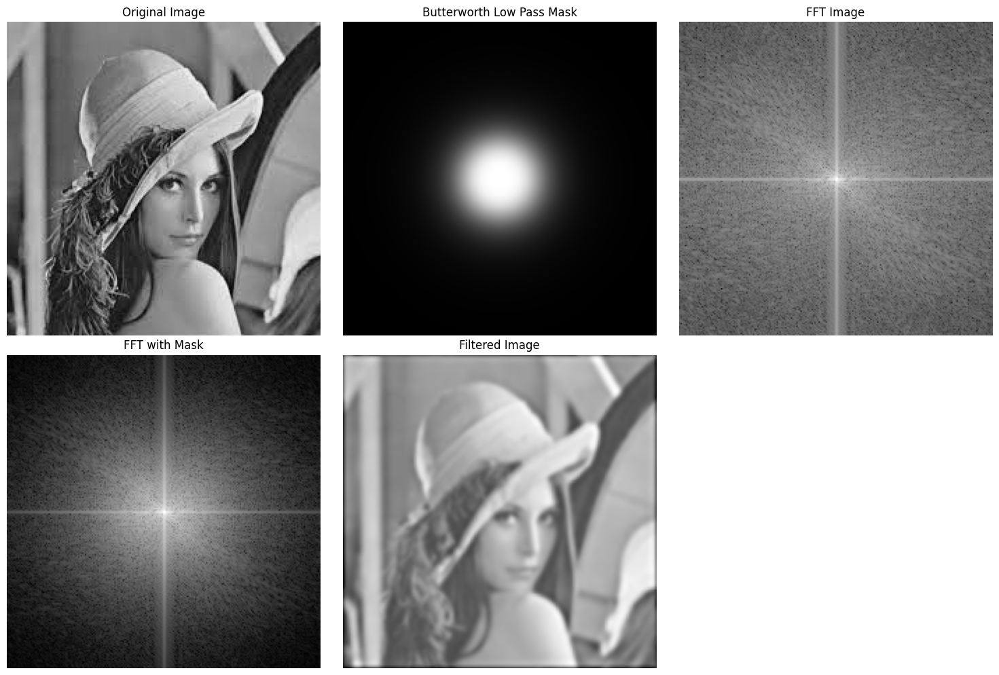

In [ ]:
apply_butterworth_low_pass_plot(img1, 30, 2)


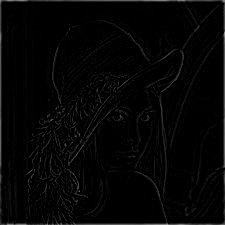

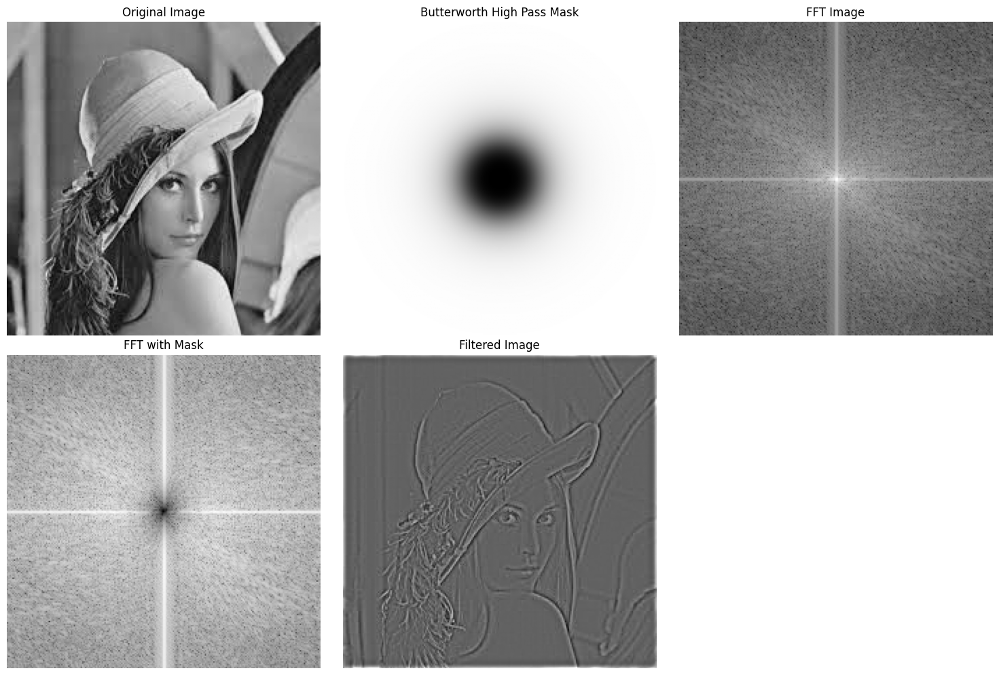

In [ ]:
apply_butterworth_high_pass_plot(img1, 30, 2)


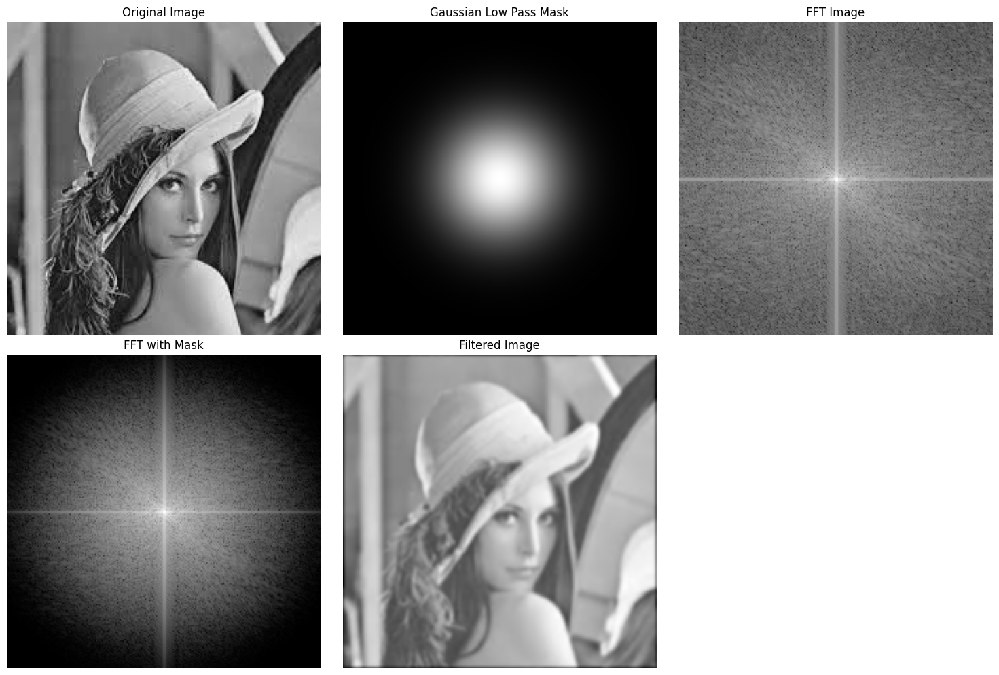

In [ ]:
apply_gaussian_low_pass_plot(img1, 30)


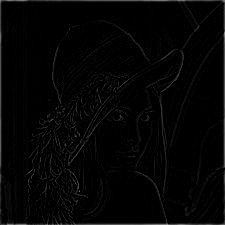

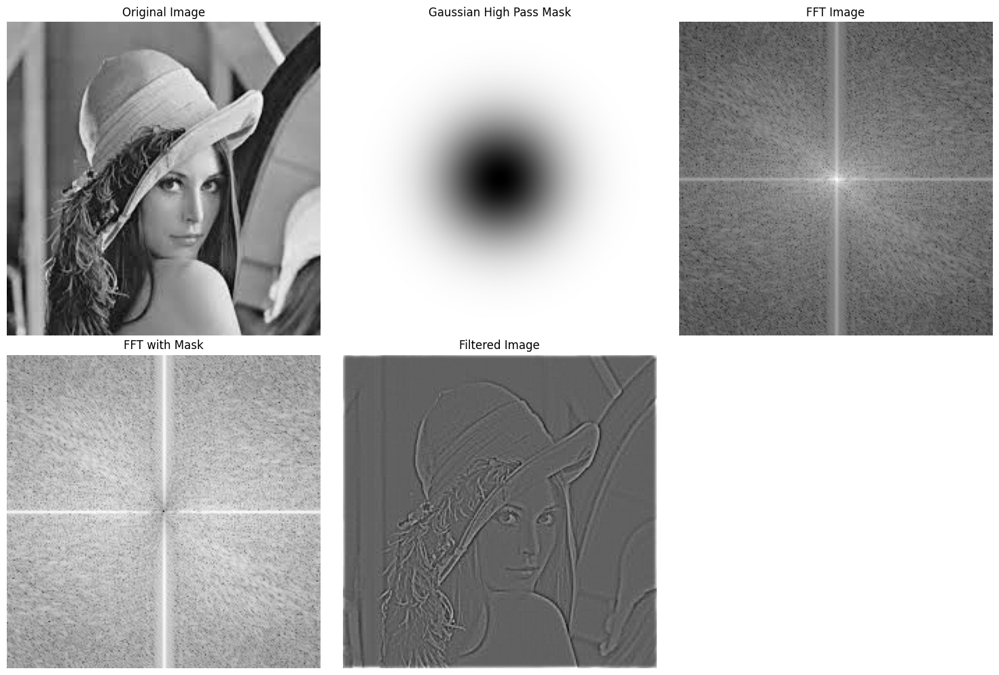

In [ ]:
apply_gaussian_high_pass_plot(img1, 30)


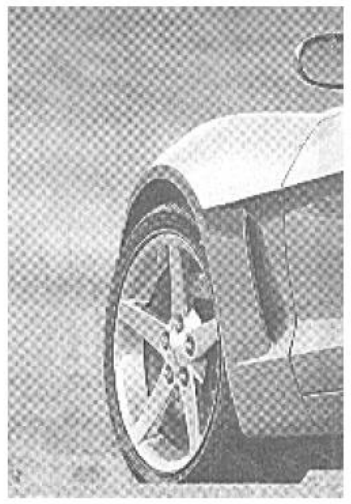

In [ ]:
img2 = cv2.imread("/content/Screenshot 2025-08-26 140022.png")
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
cv2_imshow(img2)

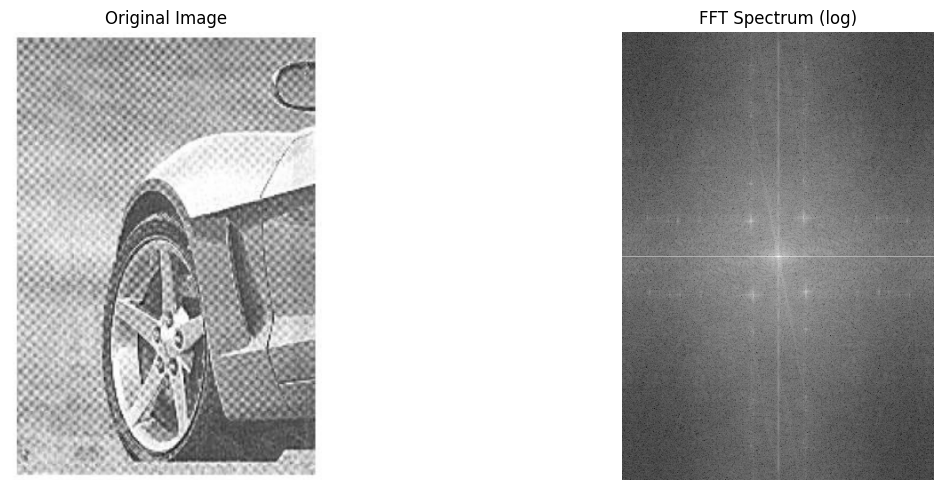

In [ ]:

def fft_and_show(img):
    img = np.float32(img)

    row, col = img.shape
    shift_mask = np.ones((row, col), dtype=np.float32)
    for i in range(row):
        for j in range(col):
            if (i + j) % 2 == 1:
                shift_mask[i, j] = -1

    img_shifted = img * shift_mask

    fft = cv2.dft(img_shifted, flags=cv2.DFT_COMPLEX_OUTPUT)
    mag = cv2.magnitude(fft[:,:,0], fft[:,:,1])
    mag_display = 20 * np.log(mag + 1)

    img_back = cv2.idft(fft, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)
    img_back = img_back * shift_mask

    plt.figure(figsize=(15,5))

    plt.subplot(1,2,1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(mag_display, cmap='gray')
    plt.title("FFT Spectrum (log)")
    plt.axis("off")


    plt.tight_layout()
    plt.show()

fft_and_show(img2)


In [ ]:
def gaussian_notch_reject_mask(shape, centers, D0):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.ones((rows, cols), dtype=np.float32)

    for cx, cy in centers:
        for u in range(rows):
            for v in range(cols):
                D1 = np.sqrt((u - (crow + cy))**2 + (v - (ccol + cx))**2)
                D2 = np.sqrt((u - (crow - cy))**2 + (v - (ccol - cx))**2)
                H = 1 - np.exp(-0.5 * (D1**2) / (D0**2))
                H *= 1 - np.exp(-0.5 * (D2**2) / (D0**2))
                mask[u, v] *= H
    return mask

def apply_notch_filter(img, centers, D0=10):
    rows, cols = img.shape
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    mask = gaussian_notch_reject_mask((rows, cols), centers, D0)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    dft_filtered = dft_shift * mask_3d

    f_ishift = np.fft.ifftshift(dft_filtered)
    img_back = cv2.idft(f_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]) + 1)
    magnitude_spectrum_filtered = 20 * np.log(cv2.magnitude(dft_filtered[:,:,0], dft_filtered[:,:,1]) + 1)


    plt.figure(figsize=(18, 12))

    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("Original FFT Spectrum")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Gaussian Notch Mask")
    plt.axis("off")


    plt.subplot(2, 3, 4)
    plt.imshow(magnitude_spectrum_filtered, cmap='gray')
    plt.title("Filtered FFT Spectrum")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(img_back, cmap='gray')
    plt.title("Filtered Image")
    plt.axis("off")

    plt.show()

    return img_back, mask


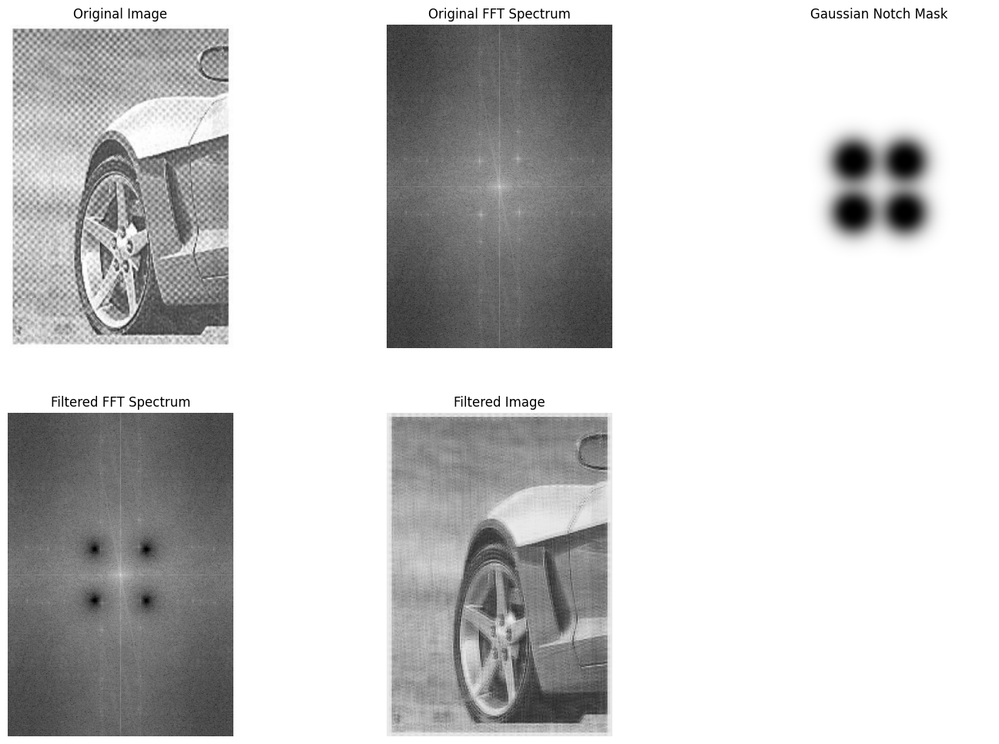

In [ ]:
centers = [(40, 40), (-40, 40), (40, -40), (-40, -40)]

filtered_img, mask = apply_notch_filter(img2, centers, D0=20)


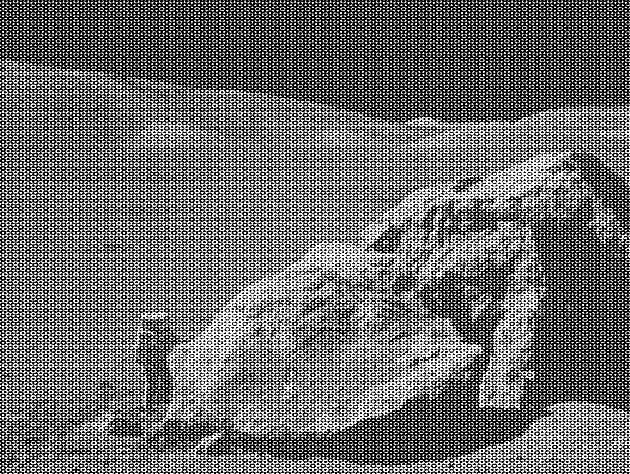

In [ ]:
img3 = cv2.imread("/content/corrupt.jpg")
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
cv2_imshow(img3)

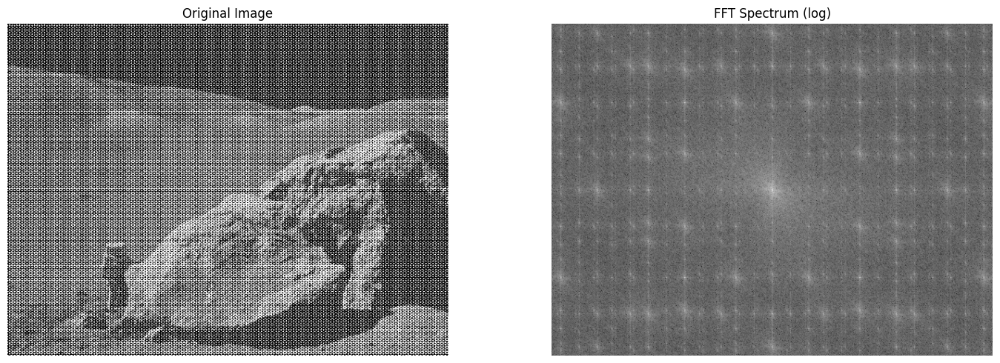

In [ ]:
fft_and_show(img3)

In [ ]:
def get_mask(shape, d0 ,w , d1 , w1):
    row, col = shape
    c_col = col//2
    c_row = row//2
    mask = np.ones((row, col), dtype=np.float32)

    for i in range(row):
        for j in range(col):
            d = np.sqrt((i - c_row)**2 + (j - c_col)**2)
            if d <= d0 and d >= d0 - w :
                mask[i, j] = 0
            if d <= d1 and d >= d1 - w1:
                mask[i,j] = 0

    return mask


def apply_notch_filter(img, D0 , w , d1 , w2):
    rows, cols = img.shape
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    mask = get_mask((rows, cols), D0 , w ,d1 , w2)
    mask_3d = np.repeat(mask[:, :, np.newaxis], 2, axis=2)

    dft_filtered = dft_shift * mask_3d

    f_ishift = np.fft.ifftshift(dft_filtered)
    img_back = cv2.idft(f_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]) + 1)
    magnitude_spectrum_filtered = 20 * np.log(cv2.magnitude(dft_filtered[:,:,0], dft_filtered[:,:,1]) + 1)


    plt.figure(figsize=(18, 12))

    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(2, 3, 2)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("Original FFT Spectrum")
    plt.axis("off")

    plt.subplot(2, 3, 3)
    plt.imshow(mask, cmap='gray')
    plt.title("Gaussian Notch Mask")
    plt.axis("off")


    plt.subplot(2, 3, 4)
    plt.imshow(magnitude_spectrum_filtered, cmap='gray')
    plt.title("Filtered FFT Spectrum")
    plt.axis("off")

    plt.subplot(2, 3, 5)
    plt.imshow(img_back, cmap='gray')
    plt.title("Filtered Image")
    plt.axis("off")

    plt.show()

    return img_back, mask


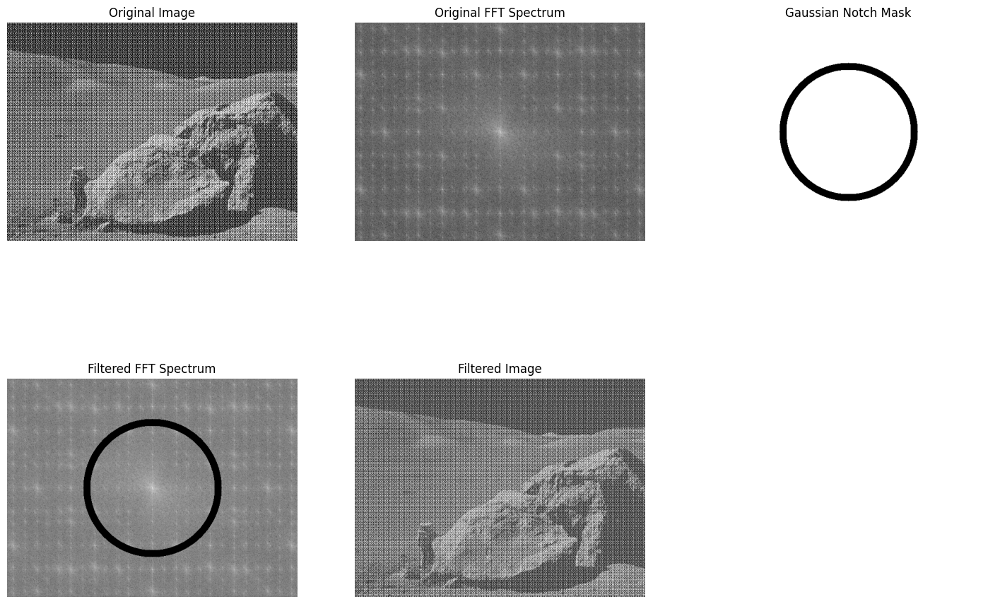

In [ ]:
filtered_img, mask = apply_notch_filter(img3, 150 , 15)